(279, 28)
['#967BBB', '#399C32', '#E64CC2', '#6E660C', '#CEFEC4', '#851FB7', '#8B767E', '#9873C4', '#9011B4', '#5F6034']


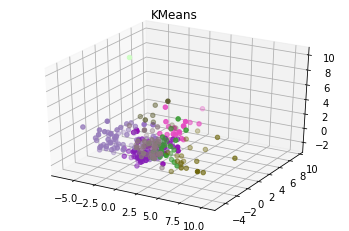

Room 1


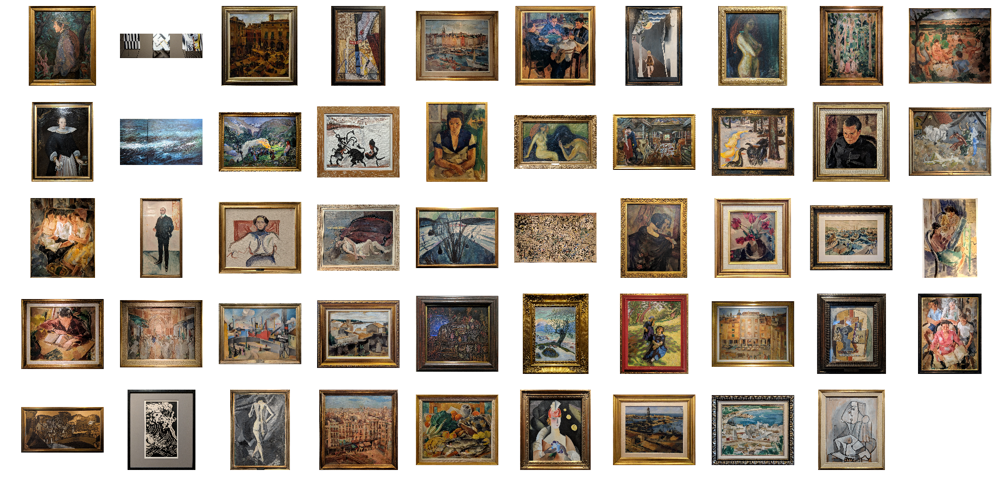

Room 2


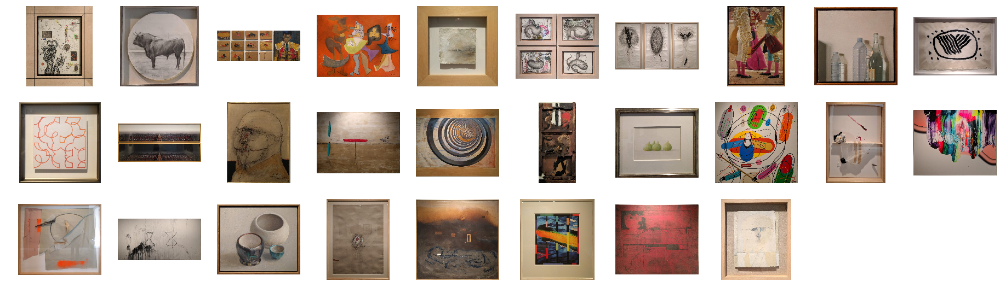

Room 3


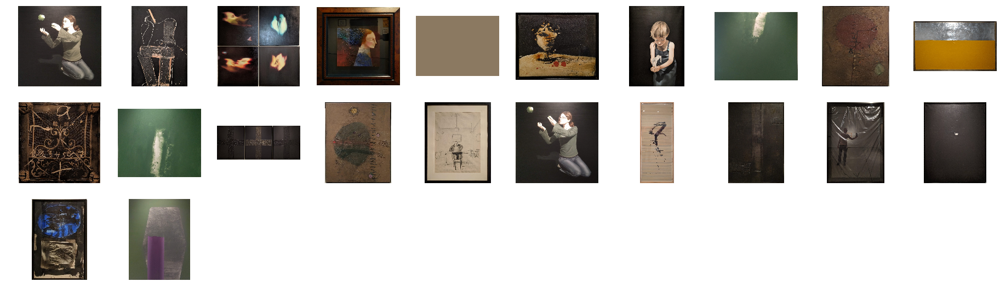

Room 4


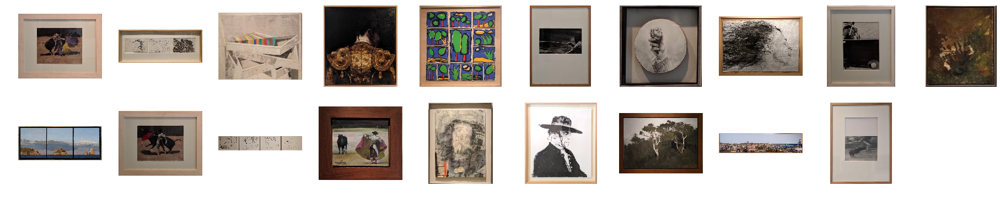

Room 5


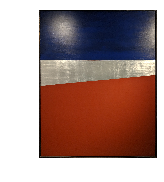

Room 6


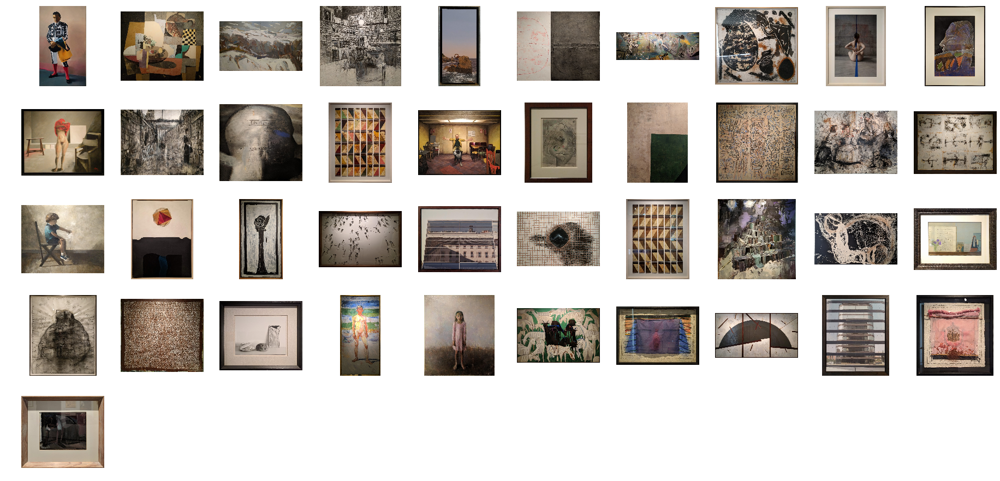

Room 7


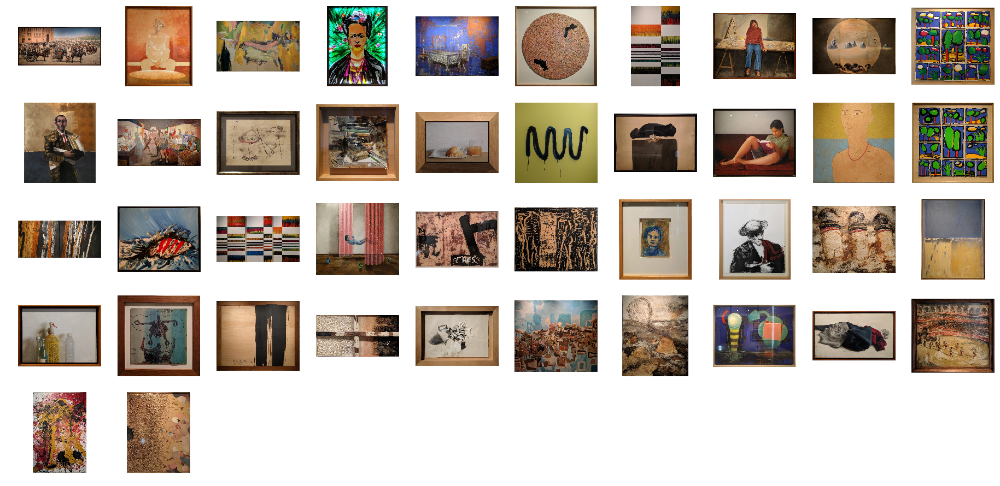

Room 8


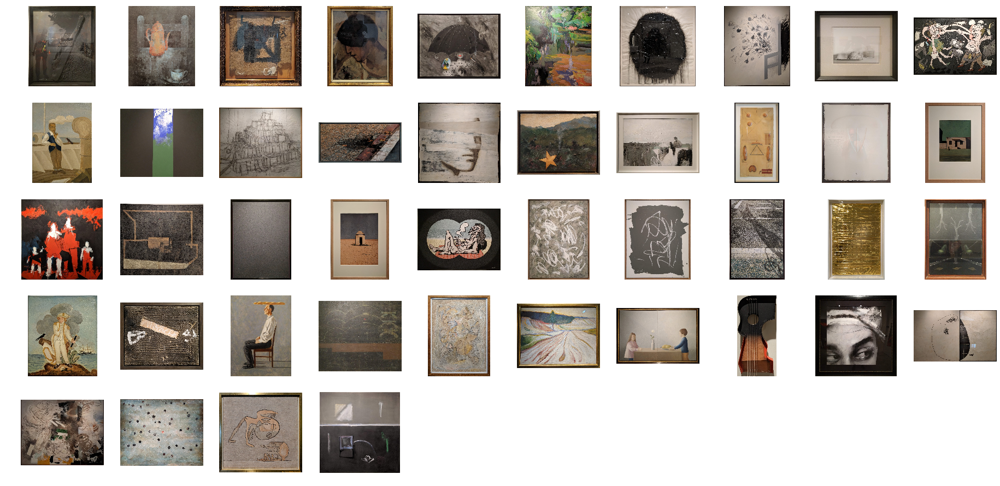

Room 9


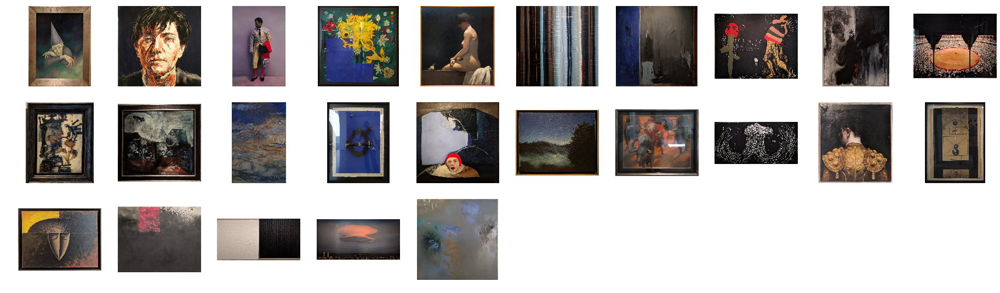

Room 10


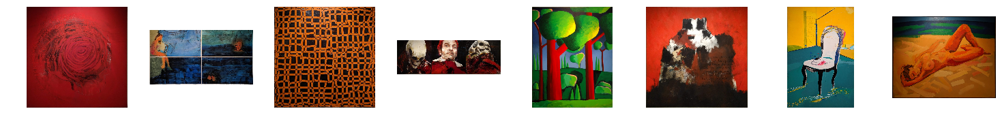

[ 1  0  2  3  4 13  6  7  8  9 10 11 12  5 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]


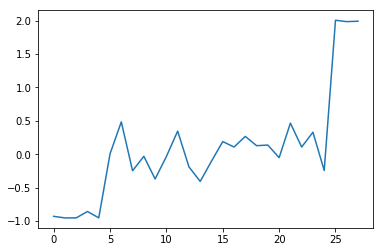

[17 25 26 23 21 27 14 18  9 10  8 11 24  7  6 15 16  5  3 19 20 22  0  1
 12  4  2 13]


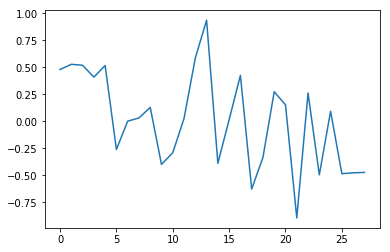

[ 6 21 23 17 22 12  0 19  8  3 15 27 11  1 14 10 16  9 18  7 20  5  4  2
 24 25 26 13]


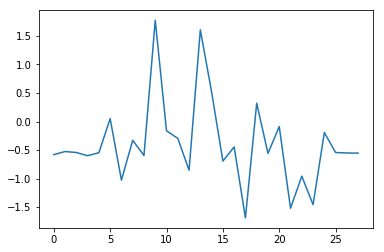

[26 27 25 17 21  5 19 22  8  9  7 11 12 23 14 15 16  6 18 24 20 10 13  1
  4  3  2  0]


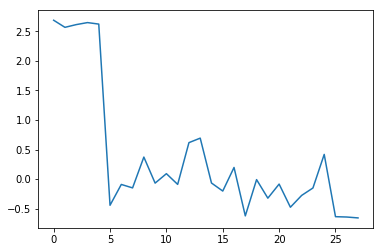

[ 8  6  1  2  4 13  0  7  5  9 10 11 12  3 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]


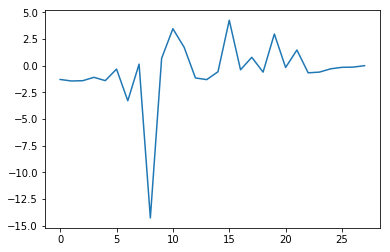

[ 9 13 19 11  0  3  4  2 26  7 10 27 25  1 14 15 24 20 18 16 17 21 22 23
  6 12  8  5]


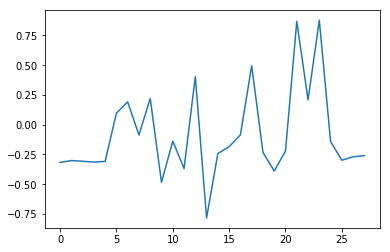

[13 27 25  9 26 18 16 20 14 10 22  8 12  7  3 24  6 17  5 23 11  0 21 19
 15  1  4  2]


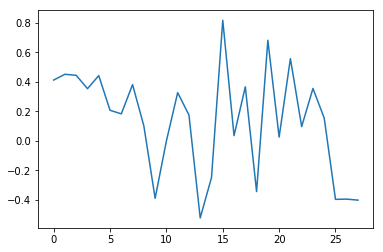

[15 21 11  2  1  4  0 27  8  9 10  7 12  6 14  5 16 17 18 19 20  3 22 23
 24 25 26 13]


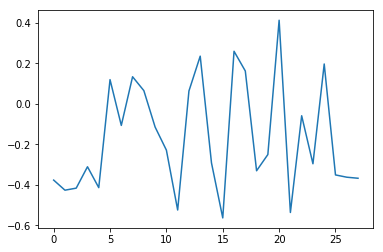

[12 15 16 19 27 26 25 13  8  9 10 11  7  1 14  6  5 17 18  4 20 21 22 23
 24  3  2  0]


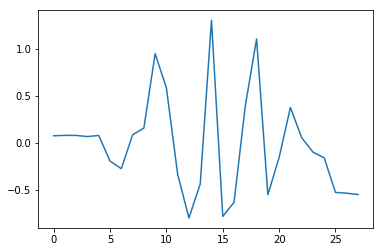

[12 16 20 25 26 27 23  8 21  6 24 17  7 13 14 15  1 11 18 19 10  9 22  5
  4  3  2  0]


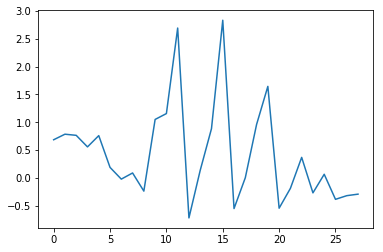

In [12]:
import cv2 as cv
import numpy as np
import glob
import pickle
import ml_metrics
import math
import pandas as pd
import os
import yaml

from matplotlib import offsetbox
from sklearn import manifold, datasets, decomposition, discriminant_analysis
from matplotlib import pyplot as plt 
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import OPTICS, cluster_optics_dbscan
from sklearn.preprocessing import normalize, scale, RobustScaler, robust_scale
import matplotlib.gridspec as gridspec
from random import randint
from mpl_toolkits.mplot3d import Axes3D
from fcmeans import FCM

from evaluation_funcs import performance_accumulation_pixel
from evaluation_funcs import performance_evaluation_pixel
from bbox_iou import bbox_iou
from extract_features import extract_features
from compute_mask import compute_mask
from compute_mask_old import compute_mask_old
from text_removal_mask import text_removal_mask
from text_removal_mask2 import find_text
from search_queries import search
from compute_lbp import compute_lbp
from compute_hog import compute_hog
from compute_dct import compute_dct
from get_text import get_text
from compute_SIFT import compute_SIFT
from compute_SURF import compute_SURF
from search_matches import search_matches_FLANN
from search_matches import search_matches_BF

import tamura
import colorgram
import pywt
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt


## PARAMETERS ##
NBINS = 32        # Number of bins (from 0 to 255)
DIVISIONS = 2     # Number of divisions per dimension [2,4,8,...]
COLORSPACE = cv.COLOR_BGR2HSV

def embedding_plot(X, title):
    x_min, x_max = np.min(X, axis=0), np.max(X, axis=0)
    X = (X - x_min) / (x_max - x_min)

    plt.figure()
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(X[:,0], X[:,1], lw=0, s=40) # c=y/10.
    
    plt.xticks([]), plt.yticks([])
    plt.title(title)

# Read DB
database = pickle.load(open('../features_tex_final.pkl','rb'))
print(np.shape(database))

# Normalize
# for i in range(np.shape(database)[1]): # N featues
#     f=[]
#     for j in range(len(database)):
#         f.append(database[j][i])
#     maxval = np.max(f)
#     minval = np.min(f)
#     for j in range(len(database)):
#         database[j][i] -= minval
#         database[j][i] /= (maxval - minval)
# transformer = RobustScaler().fit(database)
# database = transformer.transform(database)
database = scale(database)

#Principal component analysis
N_COMPONENTS = 5

# Scatter plot PCA 
db = np.array(database)
n_samples, n_features = db.shape

X_pca = decomposition.PCA(n_components=N_COMPONENTS).fit_transform(db)

# Store results of PCA in a data frame
result=pd.DataFrame(X_pca, columns=['PCA%i' % i for i in range(N_COMPONENTS)])

k=10
k_means = KMeans(init='k-means++', n_clusters=k, n_init=100)
k_means.fit(X_pca)
labels = k_means.labels_
k_means_cluster_centers = k_means.cluster_centers_
k_means_labels_unique = np.unique(labels)

colors = []
for i in range(k):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
print(colors)

if N_COMPONENTS == 2:
    fig = plt.figure()
    for k, col in zip(range(k), colors):
        my_members = labels == k
        cluster_center = k_means_cluster_centers[k]
        plt.scatter(result['PCA0'][my_members], result['PCA1'][my_members], c=col, marker='o')
    plt.title('KMeans')    
    plt.grid(True)
    plt.show()
else:
    # Create a 3D plot independently of the number of components
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for k, col in zip(range(k), colors):
        my_members = labels == k
        cluster_center = k_means_cluster_centers[k]
        ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')
    plt.title('KMeans')    
    plt.grid(True)
    plt.show()

# Plot the rooms
for k in range(10):
    my_members = labels == k
    print('Room ' + str(k+1))
    plt.figure(figsize=(32,32))

    i=0
    n=0
    for f in sorted(glob.glob('../database/*.jpg')):
        if my_members[i] == True :
            img = cv.imread(f, cv.IMREAD_COLOR)
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            ax = plt.subplot(10,10,n+1)
            plt.imshow(img)
            plt.axis('off')
            n += 1
        i+=1
    plt.show()
plt.show()

# Calculate variance of each feature in each room
for k in range(10):
    my_members = labels == k
    room_features = np.array(database)[my_members]
    histograms = np.zeros((np.shape(room_features)[0],16))
    for i in room_features:
        h = np.hist()
    room_var = np.var(room_features, axis=0)
    room_mean = np.mean(room_features, axis=0)
    idx = np.argpartition(room_mean, 5)
    print(idx)
    x = np.arange(0, 28, 1)
    plt.plot(x, room_mean)
    plt.show()

In [25]:
print(room_features[:,27])

[-0.67112445 -0.40804932  1.08071674 -0.52164995 -0.34228054 -0.53958689
 -0.42000728 -0.52164995]


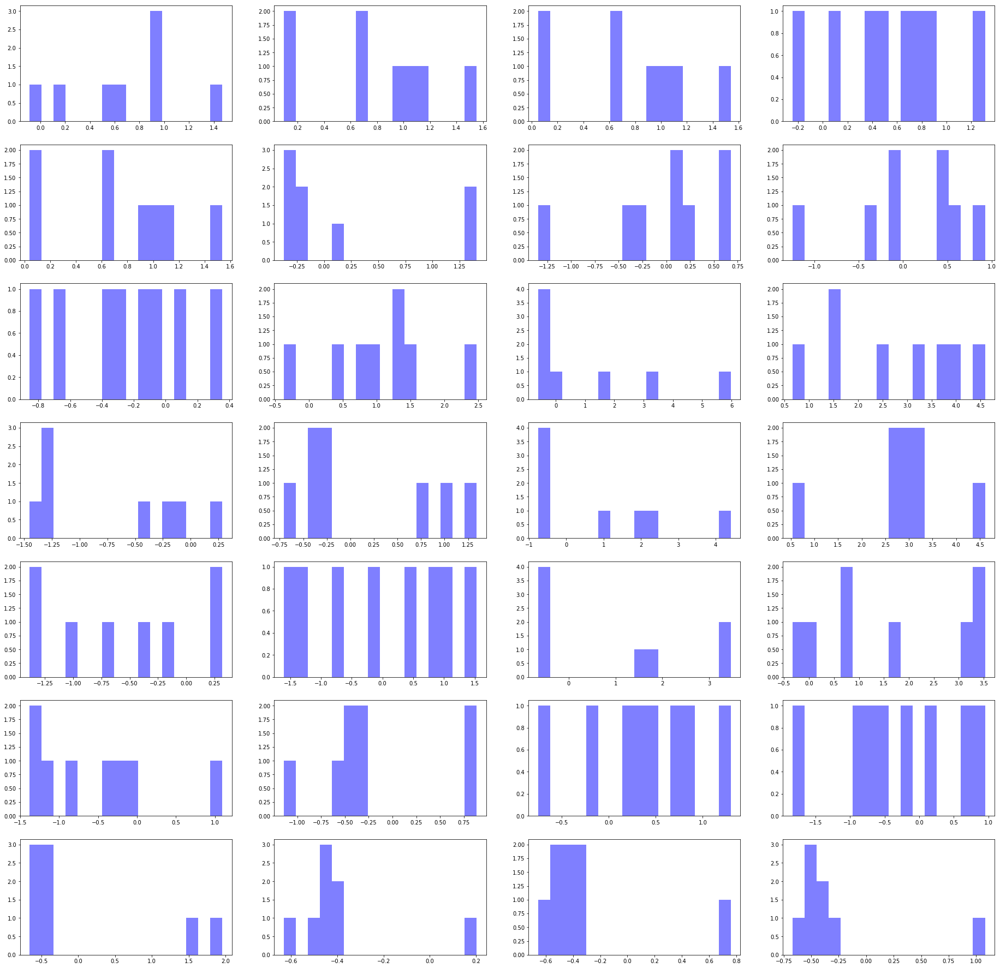

In [31]:
plt.figure(figsize=(32,32))
for i in range(0,np.shape(room_features)[1]):
    plt.subplot(7,4,i+1)
    plt.hist(room_features[:,i], 16, facecolor='blue', alpha=0.5)